# Tensorflow Optimization: Cats versus Dogs
Exploring optimization impact on size, performance and accuracy!

**For best performance on this Colab make sure you are using a GPU runtime!** The runtime can be changed by selecting: ```runtime -> change runtime type``` and selecting GPU from the hardware accelerator dropdown.

### We start by importing TensorFlow and our Dataset
And splitting our dataset into batches.

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pylab as plt
from ai_edge_litert.interpreter import Interpreter

from pathlib import Path

In [3]:
base_dir = "../../data/datasets/kagglecatsanddogs_5340_extracted/PetImages"

IMG_SIZE = 224 # this is for mobile models, for desktop models you can use 224 or 299
BATCH_SIZE = 32
SEED = 42

raw_data = tf.keras.utils.image_dataset_from_directory(
    base_dir,
    labels="inferred",
    label_mode="int",
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
)

num_batches = tf.data.experimental.cardinality(raw_data).numpy()

train_batches = int(0.80 * num_batches)
validation_batches = int(0.10 * num_batches)

raw_train = raw_data.take(train_batches)

remaining = raw_data.skip(train_batches)
raw_validation = remaining.take(validation_batches)
raw_test = remaining.skip(validation_batches)

train_batches = raw_train.prefetch(tf.data.AUTOTUNE)
validation_batches = raw_validation.prefetch(tf.data.AUTOTUNE)
test_batches = raw_test.prefetch(tf.data.AUTOTUNE)

print("Total batches:", num_batches)
print("Train batches:", tf.data.experimental.cardinality(raw_train).numpy())
print("Validation batches:", tf.data.experimental.cardinality(raw_validation).numpy())
print("Test batches:", tf.data.experimental.cardinality(raw_test).numpy())

# display the shape of our data
for image_batch, label_batch in train_batches.take(1):
    pass
image_batch.shape

Found 24991 files belonging to 2 classes.
Total batches: 781
Train batches: 624
Validation batches: 78
Test batches: 79


TensorShape([32, 224, 224, 3])

### We next define our (pre-trained) model

In [5]:
print(
    "Using Keras Applications MobileNetV2 "
    f"with input size {IMG_SIZE}"
)

num_classes = 2
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights="imagenet",
    pooling="avg"
)

base_model.trainable = False

model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=IMG_SHAPE),
    tf.keras.layers.Lambda(tf.keras.applications.mobilenet_v2.preprocess_input),
    base_model,
    tf.keras.layers.Dense(num_classes, activation="softmax")
])

model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

EPOCHS = 5

hist = model.fit(
    train_batches,
    epochs=EPOCHS,
    validation_data=validation_batches
)

Using Keras Applications MobileNetV2 with input size 224

Epoch 1/5
624/624 ━━━━━━━━━━━━━━━━━━━━ 400s 607ms/step - accuracy: 0.9794 - loss: 0.0572 - val_accuracy: 0.9900 - val_loss: 0.0340
Epoch 2/5
624/624 ━━━━━━━━━━━━━━━━━━━━ 375s 600ms/step - accuracy: 0.9895 - loss: 0.0316 - val_accuracy: 0.9904 - val_loss: 0.0268
Epoch 3/5
624/624 ━━━━━━━━━━━━━━━━━━━━ 375s 601ms/step - accuracy: 0.9914 - loss: 0.0258 - val_accuracy: 0.9892 - val_loss: 0.0305
Epoch 4/5
624/624 ━━━━━━━━━━━━━━━━━━━━ 355s 568ms/step - accuracy: 0.9925 - loss: 0.0227 - val_accuracy: 0.9880 - val_loss: 0.0407
Epoch 5/5
624/624 ━━━━━━━━━━━━━━━━━━━━ 188s 301ms/step - accuracy: 0.9935 - loss: 0.0201 - val_accuracy: 0.9908 - val_loss: 0.0267


### Your task starts here:
+ Run the code segments below, compare the size of the output files and the ```converter.optimizations = []``` options. 

**Note:** tf.lite.Optimize has changed and the OPTIMIZE_FOR_SIZE and OPTIMIZE_FOR_LATENCY options are now deprecated and are the same and DEFAULT: https://www.tensorflow.org/api_docs/python/tf/lite/Optimize

In [6]:
import pathlib
converter = tf.lite.TFLiteConverter.from_keras_model(model)


model_dir = pathlib.Path("../../models")
model_dir.mkdir(parents=True, exist_ok=True)

tflite_model = converter.convert()

tflite_model_file = model_dir/'model1.tflite'  
tflite_model_file.write_bytes(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\LINHBN~1\AppData\Local\Temp\tmpq75wp22m\assets


INFO:tensorflow:Assets written to: C:\Users\LINHBN~1\AppData\Local\Temp\tmpq75wp22m\assets


Saved artifact at 'C:\Users\LINHBN~1\AppData\Local\Temp\tmpq75wp22m'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_155')
Output Type:
  TensorSpec(shape=(None, 2), dtype=tf.float32, name=None)
Captures:
  2070598001552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598001936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598002512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598003664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598002704: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598001744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598004048: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598004816: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598004432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598002320: TensorSpec(shape=(), dtype=tf.resource, name=None)


8895236

In [7]:
import pathlib
converter = tf.lite.TFLiteConverter.from_keras_model(model)

converter.optimizations = [tf.lite.Optimize.DEFAULT]    

tflite_model = converter.convert()

tflite_model_file = model_dir/'model2.tflite'     
tflite_model_file.write_bytes(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\LINHBN~1\AppData\Local\Temp\tmpl3ce8a39\assets


INFO:tensorflow:Assets written to: C:\Users\LINHBN~1\AppData\Local\Temp\tmpl3ce8a39\assets


Saved artifact at 'C:\Users\LINHBN~1\AppData\Local\Temp\tmpl3ce8a39'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_155')
Output Type:
  TensorSpec(shape=(None, 2), dtype=tf.float32, name=None)
Captures:
  2070598001552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598001936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598002512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598003664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598002704: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598001744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598004048: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598004816: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598004432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598002320: TensorSpec(shape=(), dtype=tf.resource, name=None)


2529752

In [8]:
import pathlib
converter = tf.lite.TFLiteConverter.from_keras_model(model)

converter.optimizations = [tf.lite.Optimize.DEFAULT]    

def representative_data_gen():                          
   for input_value, _ in test_batches.take(100):
        yield [input_value]

converter.representative_dataset = representative_data_gen
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]

tflite_model = converter.convert()

tflite_model_file = model_dir/'model3.tflite'
tflite_model_file.write_bytes(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\LINHBN~1\AppData\Local\Temp\tmpy06x8w8s\assets


INFO:tensorflow:Assets written to: C:\Users\LINHBN~1\AppData\Local\Temp\tmpy06x8w8s\assets


Saved artifact at 'C:\Users\LINHBN~1\AppData\Local\Temp\tmpy06x8w8s'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_155')
Output Type:
  TensorSpec(shape=(None, 2), dtype=tf.float32, name=None)
Captures:
  2070598001552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598001936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598002512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598003664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598002704: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598001744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598004048: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598004816: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598004432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2070598002320: TensorSpec(shape=(), dtype=tf.resource, name=None)


c:\Users\Linh B Ngo\.conda\envs\tinyml\Lib\site-packages\tensorflow\lite\python\convert.py:846: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


2732912

### Your task continues
Now we will test the accuracy of the three models! After you run each model you will get the number of correct predictions and then you can plot which images were correct/incorrect!
+ Run this code
+ Change the model file to model2.tflite and run it again
+ Change the model file to model3.tflite and run it again

In [9]:
from tqdm import tqdm
# Load TFLite model and allocate tensors.

#tflite_path = model_dir / "model1.tflite"
#tflite_path = model_dir / "model2.tflite"
tflite_path = model_dir / "model3.tflite"


interpreter = Interpreter(model_path=str(tflite_path))
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

input_index = input_details[0]["index"]
output_index = output_details[0]["index"]

input_shape = input_details[0]["shape"]
input_dtype = input_details[0]["dtype"]

print("Input shape expected by TFLite:", input_shape)
print("Input dtype expected by TFLite:", input_dtype)
print("Output shape:", output_details[0]["shape"])

predictions = []
test_labels = []
test_imgs = []

single_test_batches = test_batches.unbatch().batch(1)
for img, label in tqdm(single_test_batches.take(100)):
    img_np = img.numpy().astype(input_dtype)
    interpreter.set_tensor(input_index, img_np)
    interpreter.invoke()
    predictions.append(interpreter.get_tensor(output_index))

    test_labels.append(label.numpy()[0])
    test_imgs.append(img_np[0].copy())


# This will tell you how many of the predictions were correct
score = 0
for item in range(0,len(predictions)):
  prediction=np.argmax(predictions[item])
  label = test_labels[item]
  if prediction==label:
    score=score+1

print("Out of 100 predictions I got " + str(score) + " correct")



Input shape expected by TFLite: [  1 224 224   3]
Input dtype expected by TFLite: <class 'numpy.float32'>
Output shape: [1 2]


100it [00:06, 16.18it/s]

Out of 100 predictions I got 98 correct


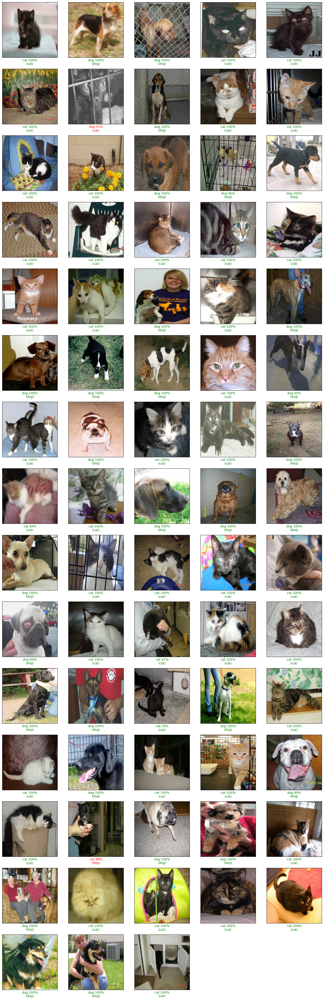

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import math

class_names = ["cat", "dog"]

def plot_image(ax, i, predictions_array, true_labels, imgs):
    probs = predictions_array[i]
    true_label = true_labels[i]
    img = imgs[i]

    img = np.squeeze(img)

    if img.dtype != np.uint8:
        img = np.clip(img, 0, 255).astype(np.uint8)

    predicted_label = np.argmax(probs)

    color = "green" if predicted_label == true_label else "red"

    ax.imshow(img)
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])

    ax.set_xlabel(
        "{} {:2.0f}%\n({})".format(
            class_names[predicted_label],
            100 * np.max(probs),
            class_names[true_label]
        ),
        color=color
    )

max_index = 73
images_per_row = 5

num_rows = math.ceil(max_index / images_per_row)

plt.figure(figsize=(images_per_row * 3, num_rows * 3))

for index in range(max_index):
    ax = plt.subplot(num_rows, images_per_row, index + 1)
    plot_image(ax, index, predictions, test_labels, test_imgs)

plt.tight_layout()
plt.show()